In [3]:
# ! ls -al /data/s3-cache/foba_events/hk/stocks_dremio/

In [4]:
# !pip install --upgrade --force-reinstall --no-deps git+ssh://git@gitlab.trading.imc.intra/apac-analysis/underlying-analysis

In [1]:
from imc_util.contrib.fullorderbook.new_enrichers.persist import s3_pull
from imc_util.contrib.fullorderbook.s3_wrappers.hk_stocks import get_days_ago
from imc_util.contrib.hk.hk_stocks_foba_util import enrich_hk_stocks_foba_dataframe_general_fields, enrich_hk_stocks_foba_dataframe_competitors
from imc_util.core.pandas_util import DataFrameReport
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

/opt/conda/envs/hk-hedging-shared/lib/python3.8/site-packages/imc_util/core/_pivot.py:8: FutureWarning: pandas.core.index is deprecated and will be removed in a future version. The public classes are available in the top-level namespace.
  from pandas.core.index import MultiIndex, Index


In [2]:
import datetime
from IPython.display import HTML
import IPython.display as iDisp
import warnings
import matplotlib.pyplot as plt

warnings.filterwarnings('ignore')

pd.options.display.max_columns = 1000
pd.options.display.max_rows = 1000
pd.set_option('display.max_colwidth', -1)
pd.set_option('display.float_format', lambda x: '{:15,.12g}'.format(float('{:.3}'.format(float(x)))))

plt.rcParams['figure.figsize'] = (25, 5)

style = """
<style>
.container { width:90% !important; }
</style>
"""
HTML(style)

In [3]:
days_ago = get_days_ago()

In [4]:
num_days = 4

In [5]:
raw_data = s3_pull(desk='hk', strategies=['stocks_dremio'], days_ago=days_ago, num_days=num_days, max_tries=3)

2024-03-06 14:33:54,470 - imc_util.contrib.fullorderbook.new_enrichers.persist - DEBUG - s3_pull_dates(strategies=[stocks_dremio], dates=[20240305, 20240304, 20240301, 20240229]): Started
2024-03-06 14:33:55,133 - imc_util.core.aws - DEBUG - Starting download from S3 for key foba_events/hk/stocks_dremio/20240305.h5
2024-03-06 14:34:00,153 - imc_util.core.aws - DEBUG - Finished download from S3 for key foba_events/hk/stocks_dremio/20240305.h5
2024-03-06 14:34:21,885 - imc_util.core.aws - DEBUG - Starting download from S3 for key foba_events/hk/stocks_dremio/20240304.h5
2024-03-06 14:34:27,870 - imc_util.core.aws - DEBUG - Finished download from S3 for key foba_events/hk/stocks_dremio/20240304.h5
2024-03-06 14:34:48,820 - imc_util.core.aws - DEBUG - Starting download from S3 for key foba_events/hk/stocks_dremio/20240301.h5
2024-03-06 14:34:53,738 - imc_util.core.aws - DEBUG - Finished download from S3 for key foba_events/hk/stocks_dremio/20240301.h5
2024-03-06 14:35:14,839 - imc_util.cor

In [6]:
# raw_data = enrich_hk_stocks_foba_dataframe(raw_data, enrich_peak_percents=False)
raw_data = enrich_hk_stocks_foba_dataframe_general_fields(raw_data)
raw_data = enrich_hk_stocks_foba_dataframe_competitors(raw_data)

In [7]:
trade_data = DataFrameReport(raw_data[raw_data.event_type == 'TRADE'].copy())

In [8]:
del raw_data

In [9]:
# pull_data = DataFrameReport(raw_data[raw_data.event_type == 'DELETE'].copy())

In [10]:
trade_data.broker_number = np.where(np.logical_and(trade_data.competitor == 'IMC', ~trade_data.broker_number.isin([1453, 765, 763, 1045, 748, 1450, 1049, 1048, 747, 746, 769, 764, 766])), 0, trade_data.broker_number)

In [11]:
trade_data['hour'] = trade_data['event_time_from_start_of_day_second'] // 3600
trade_data['minute'] = (trade_data['event_time_from_start_of_day_second'] - trade_data['hour'] * 3600) // 60

In [12]:
sectors = {'AAC': 'tech', 'ABC': 'banks', 'ACC': 'construction', 'AIA': 'insurers', 'ALB': 'tech', 'ALC': 'mining', 'ALH': 'tech', 'ANA': 'consumer', 
           'BCL': 'banks', 'BCM': 'banks', 'BIU': 'tech', 'BLI': 'tech', 'BOC': 'banks', 'BUD': 'consumer', 'BYD': 'auto', 'BYE': 'tech', 
           'CCB': 'banks', 'CCC': 'construction', 'CHT': 'telco', 'CHU': 'telco', 'CKH': 'properties', 'CKP': 'properties', 'CLI': 'insurers', 
           'CLP': 'utilities', 'CMB': 'banks', 'CNC': 'oils', 'COG': 'properties', 'COL': 'properties', 'COS': 'consumer', 'CPC': 'oils', 
           'CPI': 'insurers', 'CRL': 'properties', 'CSE': 'mining', 'CSP': 'pharma', 'CTB': 'banks', 'CTC': 'telco', 'CTS': 'markets', 
           'EVG': 'properties', 'GAH': 'auto', 'GHL': 'construction', 'GLI': 'mining', 'GLX': 'casinos', 'GWM': 'auto', 'HAI': 'markets', 
           'HDO': 'consumer', 'HEH': 'utilities', 'HEX': 'markets', 'HGN': 'consumer', 'HKB': 'banks', 'HKG': 'utilities', 'HLD': 'properties', 
           'HSB': 'banks', 'ICB': 'banks', 'JDC': 'tech', 'JDH': 'tech', 'JXC': 'mining', 'KDS': 'tech', 'KSO': 'tech', 'KST': 'tech', 
           'LAU': 'auto', 'LEN': 'tech', 'LNI': 'consumer', 'LNK': 'properties', 'MEN': 'consumer', 'MET': 'tech', 'MIU': 'tech', 'MOL': 'mining', 
           'MSB': 'banks', 'MTR': 'properties', 'NBM': 'construction', 'NCL': 'insurers', 'NFU': 'consumer', 'NTE': 'tech', 'NWD': 'properties', 
           'PAI': 'insurers', 'PEC': 'oils', 'PEN': 'auto', 'PHT': 'tech', 'PIC': 'insurers', 'SAN': 'casinos', 'SBO': 'consumer', 'SHK': 'properties', 
           'SHL': 'utilities', 'SHZ': 'consumer', 'SMC': 'tech', 'SNO': 'tech', 'SUN': 'properties', 'TCH': 'tech', 'TIC': 'consumer', 'TRP': 'tech', 
           'TWR': 'telco', 'VNK': 'properties', 'WHL': 'properties', 'WXB': 'pharma', 'XPB': 'banks', 'YZC': 'mining', 'ZAO': 'insurers'}
trade_data['sector'] = trade_data['product_symbol'].map(sectors)

In [13]:
HTML(f'<H1>HK Stocks Hedging - Competitors: {trade_data.date.max()}</H1>')

In [14]:
dates = list(trade_data['date'].unique())
iDisp.display(HTML("<H2>Dates Included:</H2>"))
for date in dates:
    iDisp.display(HTML("<p>" + str(date) + "</p>"))

In [15]:
end_prices = trade_data.groupby(['date', 'product_symbol'])[['event_price']].last().to_dict()['event_price']

def get_end_price(date, symbol):
    return end_prices[(date, symbol)]

trade_data['currency_rate'] = trade_data['turnover'] / (trade_data['event_volume'] * trade_data['event_price'])
trade_data['eod_price'] = trade_data[['date', 'product_symbol']].apply(lambda x: get_end_price(x['date'], x['product_symbol']), axis=1)

In [16]:
trade_data['slipped_pnl_eod'] = np.where(trade_data['side'] == 'BID', 
                                         (trade_data['eod_price'] - trade_data['event_price']) * trade_data['event_volume'] * trade_data['currency_rate'] - trade_data['fees'], 
                                        (trade_data['event_price'] - trade_data['eod_price']) * trade_data['event_volume'] * trade_data['currency_rate'] - trade_data['fees'])
trade_data['aggressor_slipped_pnl_eod'] = np.where(trade_data['side'] == 'BID', 
                                                   (trade_data['event_price'] - trade_data['eod_price']) * trade_data['event_volume'] * trade_data['currency_rate'] - trade_data['fees'], 
                                                   (trade_data['eod_price'] - trade_data['event_price']) * trade_data['event_volume'] * trade_data['currency_rate'] - trade_data['fees'])

In [17]:
def display_table(data, index, group_broker=False, group_competitor=False, aggressive=False, sort_by='slipped_pnl_120s', ascending=False, max_rows=10, turnover_filter=None):
    data.reset()
    column_prefix = 'aggressor_' if aggressive else ''
    broker = 'foreign_counterparty' if aggressive else 'broker_name'
    sell_condition = data.direction > 0 if aggressive else data.direction < 0
    buy_condition = data.direction < 0 if aggressive else data.direction > 0
    
    
    if group_broker:
        temp = data.group_row(broker).group_row(index).sum(f'{column_prefix}slipped_pnl_0s').sum(f'{column_prefix}slipped_pnl_60s').sum(f'{column_prefix}slipped_pnl_120s').sum(f'{column_prefix}slipped_pnl_300s').sum(
            f'{column_prefix}slipped_pnl_900s').sum(f'{column_prefix}slipped_pnl_eod').sum('turnover').fast_report()
        total_turnover = temp.loc[('All', ''), 'turnover']
        temp_sell = data.distill(sell_condition).group_row(broker).group_row(index).sum('turnover', name='sell_turnover').fast_report()
        temp_buy = data.distill(buy_condition).group_row(broker).group_row(index).sum('turnover', name='buy_turnover').fast_report()
    elif group_competitor:
        temp = data.group_row('competitor').group_row(index).sum(f'{column_prefix}slipped_pnl_0s').sum(f'{column_prefix}slipped_pnl_60s').sum(f'{column_prefix}slipped_pnl_120s').sum(f'{column_prefix}slipped_pnl_300s').sum(
            f'{column_prefix}slipped_pnl_900s').sum(f'{column_prefix}slipped_pnl_eod').sum('turnover').fast_report()
        total_turnover = temp.loc[('All', ''), 'turnover']
        temp_sell = data.distill(sell_condition).group_row('competitor').group_row(index).sum('turnover', name='sell_turnover').fast_report()
        temp_buy = data.distill(buy_condition).group_row('competitor').group_row(index).sum('turnover', name='buy_turnover').fast_report()
    
    else:
        temp = data.group_row(index).sum(f'{column_prefix}slipped_pnl_0s').sum(f'{column_prefix}slipped_pnl_60s').sum(f'{column_prefix}slipped_pnl_120s').sum(f'{column_prefix}slipped_pnl_300s').sum(
            f'{column_prefix}slipped_pnl_900s').sum(f'{column_prefix}slipped_pnl_eod').sum('turnover').fast_report()
        total_turnover = temp.loc['All', 'turnover']
        temp_sell = data.distill(sell_condition).group_row(index).sum('turnover', name='sell_turnover').fast_report()
        temp_buy = data.distill(buy_condition).group_row(index).sum('turnover', name='buy_turnover').fast_report()
    temp = pd.concat([temp, temp_buy, temp_sell], axis=1).fillna(value=0)
    temp['mkt%'] = temp['turnover'] / total_turnover * 100
    temp['bps_pnl_120s'] = temp[f'{column_prefix}slipped_pnl_120s'] / temp['turnover'] * 10000
    temp['bps_pnl_900s'] = temp[f'{column_prefix}slipped_pnl_900s'] / temp['turnover'] * 10000
    
    for i in ['UNKNOWN', 'MKT', 'All']:
        if i in temp.index:
            temp.drop(i, inplace=True)
    if turnover_filter:
        temp = temp[temp.turnover > turnover_filter].sort_values(sort_by, ascending=ascending).head(max_rows)
    else:
        temp = temp.sort_values(sort_by, ascending=ascending).head(max_rows)
    iDisp.display(temp.heatmap(cols=slice(0, 6), buffer=1.5).heatmap(cols=slice(6, 9), cmap='RdBu', buffer=1.5).heatmap(cols=9, cmap='bwr', buffer=1.5).heatmap(cols=slice(10,12), cmap='BrBG', buffer=1.5, color_bounds=[0, None]).render_css())

In [18]:
trade_data['competitor'] = np.where(trade_data['broker_number'].isin([4487, 4488, 2077, 2078, 2079]), 'Barclays Hit', trade_data['competitor'])
trade_data['broker_name'] = np.where(trade_data['broker_number'].isin([4487, 4488, 2077, 2078, 2079]), 'Barclays Hit', trade_data['broker_name'])

In [19]:
trade_data['competitor'] = np.where((trade_data.competitor == 'IMC') & (trade_data.imc_auto_trader.str.contains('Bsk_Exe')), 'IMC_BSK', trade_data['competitor'])

In [20]:
iDisp.display(HTML("<H2>Quote Summary</H2>"))

In [21]:
iDisp.display(HTML("<H3>Quote Main Competitors</H3>"))
display_table(trade_data, index='competitor')

,slipped_pnl_0s,slipped_pnl_60s,slipped_pnl_120s,slipped_pnl_300s,slipped_pnl_900s,slipped_pnl_eod,turnover,buy_turnover,sell_turnover,mkt%,bps_pnl_120s,bps_pnl_900s
competitor,,,,,,,,,,,,
ABN,"1,510,000","575,000","674,000","650,000","683,000","435,000","2,990,000,000","1,140,000,000","1,850,000,000",7.68,2.25,2.28
Optiver,"376,000","218,000","214,000","220,000","215,000","189,000","338,000,000","146,000,000","192,000,000",0.868,6.34,6.36
IMC_BSK,"285,000","61,200","65,200","46,900","69,000","130,000","466,000,000","222,000,000","245,000,000",1.2,1.4,1.48
UBS,"63,400","45,500","57,600","39,100","42,700","93,200","74,800,000","33,900,000","40,900,000",0.192,7.71,5.71
Yue Kun,"229,000","46,500","50,800","61,100","42,100","133,000","233,000,000","105,000,000","128,000,000",0.599,2.18,1.8
IMC,"188,000","29,000","43,300","13,800","-119,000","-586,000","352,000,000","161,000,000","191,000,000",0.905,1.23,-3.38
Barclays Hit,"31,000","8,800","8,400",-912,"-3,380","-56,700","40,400,000","16,200,000","24,200,000",0.104,2.08,-0.837
Citadel,"5,330","-3,410","-5,410","-10,600","-17,600","-43,700","6,150,000","2,700,000","3,460,000",0.0158,-8.8,-28.6
Eclipse,"163,000","-39,600","-21,800","-45,700","-31,700","-16,300","389,000,000","182,000,000","207,000,000",0.999,-0.56,-0.816


In [22]:
iDisp.display(HTML("<H3>Quote - Broker by PnL</H3>"))
display_table(trade_data, index='broker_name')

,slipped_pnl_0s,slipped_pnl_60s,slipped_pnl_120s,slipped_pnl_300s,slipped_pnl_900s,slipped_pnl_eod,turnover,buy_turnover,sell_turnover,mkt%,bps_pnl_120s,bps_pnl_900s
broker_name,,,,,,,,,,,,
ABN AMRO Clearing Hong Kong Limited,"1,520,000","583,000","684,000","658,000","684,000","380,000","3,020,000,000","1,150,000,000","1,870,000,000",7.75,2.27,2.27
Optiver Trading Hong Kong Limited,"376,000","218,000","214,000","220,000","214,000","188,000","338,000,000","146,000,000","192,000,000",0.868,6.34,6.34
Aristo Securities Limited,"88,000","103,000","102,000","83,200","60,000","91,600","22,800,000","13,000,000","9,820,000",0.0585,44.8,26.3
Jump Trading Hong Kong Limited,"140,000","49,900","56,500","61,600","63,400","-4,690","183,000,000","84,800,000","98,000,000",0.469,3.09,3.47
Yue Kun Research Limited,"229,000","46,700","51,200","61,600","42,300","132,000","234,000,000","105,000,000","128,000,000",0.6,2.19,1.81
Fulbright Securities Limited,"90,900","48,000","46,100","46,300","19,500","55,300","100,000,000","47,000,000","53,400,000",0.258,4.59,1.95
Chief Securities Limited,"66,400","42,800","37,800","42,000","40,500","-45,700","49,900,000","27,800,000","22,200,000",0.128,7.58,8.11
"Guosen Securities (HK) Brokerage Company, Limited","23,000","10,600","13,800","21,100","35,100","109,000","30,400,000","5,800,000","24,600,000",0.0781,4.53,11.6
IMC Asia Pacific Limited,"531,000","32,800","9,800","-68,100","-235,000","-325,000","973,000,000","350,000,000","623,000,000",2.5,0.101,-2.42


In [23]:
iDisp.display(HTML("<H3>Quote - Broker by Turnover</H3>"))
display_table(trade_data, index='broker_name', sort_by='turnover')

,slipped_pnl_0s,slipped_pnl_60s,slipped_pnl_120s,slipped_pnl_300s,slipped_pnl_900s,slipped_pnl_eod,turnover,buy_turnover,sell_turnover,mkt%,bps_pnl_120s,bps_pnl_900s
broker_name,,,,,,,,,,,,
China Investment Information Services Limited,"1,040,000","-886,000","-931,000","-719,000","-1,250,000","-4,260,000","3,180,000,000","1,810,000,000","1,360,000,000",8.16,-2.93,-3.95
ABN AMRO Clearing Hong Kong Limited,"1,520,000","583,000","684,000","658,000","684,000","380,000","3,020,000,000","1,150,000,000","1,870,000,000",7.75,2.27,2.27
China Innovation Market Service Company Limited,"762,000","-868,000","-816,000","-535,000","-541,000","-1,770,000","2,350,000,000","1,190,000,000","1,160,000,000",6.05,-3.46,-2.3
Morgan Stanley Hong Kong Securities Limited,"446,000","-1,100,000","-1,130,000","-1,080,000","-1,160,000","-2,400,000","2,160,000,000","815,000,000","1,350,000,000",5.55,-5.25,-5.38
J.P. Morgan Broking (Hong Kong) Limited,"451,000","-629,000","-691,000","-622,000","-641,000","1,230,000","1,870,000,000","638,000,000","1,230,000,000",4.79,-3.7,-3.44
Merrill Lynch Far East Limited,"279,000","-756,000","-806,000","-840,000","-998,000","-695,000","1,840,000,000","787,000,000","1,060,000,000",4.73,-4.37,-5.42
Goldman Sachs (Asia) Securities Limited,"167,000","-747,000","-738,000","-657,000","-695,000","1,080,000","1,620,000,000","704,000,000","919,000,000",4.17,-4.55,-4.28
Citigroup Global Markets Asia Limited,"50,600","-670,000","-650,000","-673,000","-617,000","257,000","1,430,000,000","571,000,000","863,000,000",3.68,-4.54,-4.3
UBS Securities Hong Kong Limited,"228,000","-467,000","-460,000","-401,000","-317,000","434,000","1,320,000,000","532,000,000","786,000,000",3.39,-3.49,-2.41


In [24]:
iDisp.display(HTML("<H3>Quote - Broker / Symbol by Pnl</H3>"))
display_table(trade_data, index='product_symbol', group_broker=True)

In [25]:
iDisp.display(HTML("<H3>Quote - Broker ID by PnL</H3>"))
display_table(trade_data, index='broker_number', group_broker=True)

In [26]:
iDisp.display(HTML("<H3>Quote - Broker ID by BPS</H3>"))
display_table(trade_data, index='broker_number', sort_by='bps_pnl_900s', group_broker=True, turnover_filter=50e6)

In [27]:
iDisp.display(HTML("<H3>Quote - Broker / Sector by PnL</H3>"))
display_table(trade_data, index='sector', group_broker=True)

In [28]:
iDisp.display(HTML("<H3>Quote - Own / Competitor by Date</H3>"))
display_table(trade_data[trade_data.competitor.isin(['ABN','IMC','Yue Kun','JP','UBS','Optiver'])], index='date', group_broker=False, group_competitor=True,sort_by=[
    'date','competitor'], max_rows=6*num_days)

,,slipped_pnl_0s,slipped_pnl_60s,slipped_pnl_120s,slipped_pnl_300s,slipped_pnl_900s,slipped_pnl_eod,turnover,buy_turnover,sell_turnover,mkt%,bps_pnl_120s,bps_pnl_900s
competitor,date,,,,,,,,,,,,
Yue Kun,2024-03-05,"55,300","4,810","-1,390","-6,690","-22,500","-12,800","62,000,000","21,000,000","41,100,000",1.47,-0.225,-3.63
UBS,2024-03-05,"8,470","4,120","1,800","-10,600","-29,200","-5,240","11,300,000","4,720,000","6,550,000",0.268,1.6,-25.9
Optiver,2024-03-05,"88,100","31,300","29,300","26,600","5,070","82,500","93,600,000","31,800,000","61,800,000",2.22,3.13,0.542
JP,2024-03-05,"15,300","-23,500","-26,200","-19,600","-11,200","82,600","54,000,000","10,200,000","43,800,000",1.28,-4.85,-2.08
IMC,2024-03-05,"44,200","1,760","4,320",-499,"-23,600","-49,900","82,000,000","44,100,000","37,800,000",1.95,0.527,-2.87
ABN,2024-03-05,"402,000","79,900","68,200","58,700","49,300","1,480,000","782,000,000","166,000,000","616,000,000",18.6,0.873,0.63
Yue Kun,2024-03-04,"71,800","18,700","13,100","25,100","15,100","18,000","71,700,000","36,000,000","35,700,000",1.7,1.83,2.1
UBS,2024-03-04,"15,500","15,900","23,900","27,100","45,700","97,200","17,700,000","8,490,000","9,220,000",0.42,13.5,25.8
Optiver,2024-03-04,"96,600","56,800","50,800","52,000","70,400","58,200","88,200,000","48,200,000","40,000,000",2.09,5.76,7.98


In [29]:
# iDisp.display(HTML("<H3>Quote - Own / ABN by Date</H3>"))
# display_table(trade_data[trade_data.broker_name.isin(['ABN AMRO Clearing Hong Kong Limited', 'IMC Asia Pacific Limited','Yue Kun Research Limited', 'UNKNOWN'])], index='date', group_broker=True, sort_by=[
#     'date', 'broker_name'], max_rows=3*num_days)

In [30]:
trade_data['book_width_at_event'] = trade_data['asks_0_price_at_event_'] - trade_data['bids_0_price_at_event_']
trade_data['book_width_at_join'] = trade_data['asks_0_price_at_join_'] - trade_data['bids_0_price_at_join_']
trade_data['ticks_wide_at_event'] = (trade_data['book_width_at_event'] / trade_data['tick_size']).round(0)
trade_data['ticks_wide_at_join'] = (trade_data['book_width_at_join'] / trade_data['tick_size']).round(0)

In [31]:
trade_data['ticks_wide_at_event_bucket'] = np.where(trade_data.ticks_wide_at_event == 1, '1', np.where(trade_data.ticks_wide_at_event == 2, '2', np.where(trade_data.ticks_wide_at_event > 2, '3+', '0')))
trade_data['ticks_wide_at_join_bucket'] = np.where(trade_data.ticks_wide_at_join == 1, '1', np.where(trade_data.ticks_wide_at_join == 2, '2', np.where(trade_data.ticks_wide_at_join > 2, '3+', '0')))

In [32]:
iDisp.display(HTML("<H2> LONG TERM ABN vs IMC Stats  various buckets </H3>"))

In [33]:
iDisp.display(HTML("<H3> PNL by number of ticks wide at event </H3>"))
a = trade_data[trade_data.competitor.isin(['ABN','IMC','IMC_BSK'])].groupby(['competitor','ticks_wide_at_event_bucket'])[
    ['turnover', 'slipped_pnl_120s','slipped_pnl_300s', 'slipped_pnl_900s']].sum()

a['bps_120s'] = a['slipped_pnl_120s'] / a['turnover'] * 10000
a['bps_300s'] = a['slipped_pnl_300s'] / a['turnover'] * 10000
a['bps_900s'] = a['slipped_pnl_900s'] / a['turnover'] * 10000
a

turnover  slipped_pnl_120s  \
competitor ticks_wide_at_event_bucket                                     
ABN        0                              298,000,000          48,300     
           1                            2,290,000,000         436,000     
           2                              358,000,000         171,000     
           3+                              45,400,000          18,000     
IMC        0                               28,100,000           4,410     
           1                              235,000,000          22,600     
           2                               75,400,000           5,520     
           3+                              14,400,000          10,700     
IMC_BSK    0                               67,100,000           7,190     
           1                              298,000,000          25,600     
           2                               88,400,000          24,000     
           3+                              13,000,000           8,400     

                                       slipped_pnl_300s  slipped_pnl_900s  \
competitor ticks_wide_at_event_bucket                                       
ABN        0                                   58,900            85,400     
           1                                  396,000           425,000     
           2                                  166,000           171,000     
           3+                                  29,100               832     
IMC        0                                    3,720             7,170     
           1                                   -3,030           -51,100     
           2                                     -102           -66,100     
           3+                                  13,200            -9,070     
IMC_BSK    0                                   13,600            17,300     
           1                                    9,010            23,200     
           2                                   16,900            19,100     
           3+                                   7,430             9,360     

                                             bps_120s        bps_300s  \
competitor ticks_wide_at_event_bucket                                   
ABN        0                                     1.62            1.97   
           1                                     1.91            1.73   
           2                                     4.77            4.62   
           3+                                    3.96             6.4   
IMC        0                                     1.57            1.33   
           1                                    0.965          -0.129   
           2                                    0.732         -0.0135   
           3+                                    7.45             9.2   
IMC_BSK    0                                     1.07            2.03   
           1                                    0.858           0.302   
           2                                     2.72            1.91   
           3+                                    6.45             5.7   

                                             bps_900s  
competitor ticks_wide_at_event_bucket                  
ABN        0                                     2.86  
           1                                     1.86  
           2                                     4.78  
           3+                                   0.183  
IMC        0                                     2.55  
           1                                    -2.18  
           2                                    -8.76  
           3+                                    -6.3  
IMC_BSK    0                                     2.58  
           1                                    0.779  
           2                                     2.16  
           3+                                    7.19

In [34]:
iDisp.display(HTML("<H3> PNL by number of ticks wide at join </H3>"))
a = trade_data[trade_data.competitor.isin(['ABN','IMC','IMC_BSK'])].groupby(['competitor','ticks_wide_at_join_bucket'])[
    ['turnover', 'slipped_pnl_120s','slipped_pnl_300s', 'slipped_pnl_900s']].sum()

a['bps_120s'] = a['slipped_pnl_120s'] / a['turnover'] * 10000
a['bps_300s'] = a['slipped_pnl_300s'] / a['turnover'] * 10000
a['bps_900s'] = a['slipped_pnl_900s'] / a['turnover'] * 10000
a

turnover  slipped_pnl_120s  \
competitor ticks_wide_at_join_bucket                                     
ABN        0                             300,000,000          51,600     
           1                           2,130,000,000         439,000     
           2                             496,000,000         171,000     
           3+                             61,000,000          11,700     
IMC        0                              27,300,000           4,680     
           1                             208,000,000          20,400     
           2                              92,900,000          12,100     
           3+                             23,900,000           6,100     
IMC_BSK    0                              64,900,000           6,570     
           1                             306,000,000          38,600     
           2                              82,600,000          15,200     
           3+                             13,100,000           4,720     

                                      slipped_pnl_300s  slipped_pnl_900s  \
competitor ticks_wide_at_join_bucket                                       
ABN        0                                  53,000            81,300     
           1                                 400,000           409,000     
           2                                 174,000           177,000     
           3+                                 22,000            15,500     
IMC        0                                   4,000             8,320     
           1                                   6,090           -63,300     
           2                                  -1,130           -44,200     
           3+                                  4,870           -19,900     
IMC_BSK    0                                  12,700            18,100     
           1                                  23,900            36,100     
           2                                   4,500            10,000     
           3+                                  5,880             4,740     

                                            bps_120s        bps_300s  \
competitor ticks_wide_at_join_bucket                                   
ABN        0                                    1.72            1.77   
           1                                    2.06            1.88   
           2                                    3.45            3.52   
           3+                                   1.91            3.61   
IMC        0                                    1.72            1.47   
           1                                   0.981           0.292   
           2                                     1.3          -0.122   
           3+                                   2.55            2.04   
IMC_BSK    0                                    1.01            1.95   
           1                                    1.26           0.781   
           2                                    1.85           0.545   
           3+                                   3.61            4.51   

                                            bps_900s  
competitor ticks_wide_at_join_bucket                  
ABN        0                                    2.71  
           1                                    1.92  
           2                                    3.57  
           3+                                   2.54  
IMC        0                                    3.05  
           1                                   -3.04  
           2                                   -4.76  
           3+                                  -8.31  
IMC_BSK    0                                    2.79  
           1                                    1.18  
           2                                    1.21  
           3+                                   3.63

In [35]:
iDisp.display(HTML("<H3> PNL by join type </H3>"))
a = trade_data[trade_data.competitor.isin(['ABN','IMC','IMC_BSK'])].groupby(['competitor','join_type'])[
    ['turnover', 'slipped_pnl_120s','slipped_pnl_300s', 'slipped_pnl_900s']].sum()

a['bps_120s'] = a['slipped_pnl_120s'] / a['turnover'] * 10000
a['bps_300s'] = a['slipped_pnl_300s'] / a['turnover'] * 10000
a['bps_900s'] = a['slipped_pnl_900s'] / a['turnover'] * 10000
a

turnover  slipped_pnl_120s  slipped_pnl_300s  \
competitor join_type                                                         
ABN        CROSS             9,790,000          -4,560               862     
           DEEPER_JOIN     101,000,000          23,500            14,800     
           DIME            217,000,000          69,200            68,400     
           JOIN          2,660,000,000         586,000           566,000     
IMC        CROSS               619,000           -57.2              -871     
           DEEPER_JOIN      61,900,000           9,430             6,270     
           DIME             70,200,000          18,600             6,810     
           JOIN            220,000,000          15,300             1,620     
IMC_BSK    CROSS               114,000              99              56.4     
           DEEPER_JOIN      72,400,000          23,300            24,200     
           DIME             21,200,000           5,420             7,690     
           JOIN            373,000,000          36,400            15,000     

                        slipped_pnl_900s        bps_120s        bps_300s  \
competitor join_type                                                       
ABN        CROSS                  43.2             -4.66            0.88   
           DEEPER_JOIN           4,830              2.34            1.48   
           DIME                 98,700              3.19            3.16   
           JOIN                579,000               2.2            2.12   
IMC        CROSS                -2,780            -0.924           -14.1   
           DEEPER_JOIN         -26,800              1.52            1.01   
           DIME                 -6,940              2.65            0.97   
           JOIN                -82,500             0.698          0.0738   
IMC_BSK    CROSS                 -96.2              8.65            4.93   
           DEEPER_JOIN          29,300              3.22            3.35   
           DIME                  8,290              2.56            3.63   
           JOIN                 31,500             0.976           0.402   

                              bps_900s  
competitor join_type                    
ABN        CROSS                0.0441  
           DEEPER_JOIN            0.48  
           DIME                   4.56  
           JOIN                   2.17  
IMC        CROSS                 -44.9  
           DEEPER_JOIN           -4.33  
           DIME                 -0.988  
           JOIN                  -3.76  
IMC_BSK    CROSS                 -8.41  
           DEEPER_JOIN            4.05  
           DIME                   3.91  
           JOIN                  0.844

In [36]:
iDisp.display(HTML("<H3> PNL by category </H3>"))
a = trade_data[trade_data.competitor.isin(['ABN','IMC','IMC_BSK'])].groupby(['competitor','category'])[
    ['turnover', 'slipped_pnl_120s','slipped_pnl_300s', 'slipped_pnl_900s']].sum()

a['bps_120s'] = a['slipped_pnl_120s'] / a['turnover'] * 10000
a['bps_300s'] = a['slipped_pnl_300s'] / a['turnover'] * 10000
a['bps_900s'] = a['slipped_pnl_900s'] / a['turnover'] * 10000
a

turnover  slipped_pnl_120s  slipped_pnl_300s  \
competitor category                                                       
ABN        BOOV           9,790,000          -4,560               862     
           DEPTH         91,000,000          18,600             8,570     
           EARLY      1,070,000,000         332,000           293,000     
           LATE       1,810,000,000         316,000           337,000     
           PRE_OPEN      11,400,000          11,600            10,700     
IMC        BOOV             619,000           -57.2              -871     
           DEPTH         61,900,000           9,430             6,270     
           EARLY        118,000,000          13,700            -6,770     
           LATE         171,000,000          20,300            15,200     
IMC_BSK    BOOV             114,000              99              56.4     
           DEPTH         72,400,000          23,300            24,200     
           EARLY        142,000,000          24,500            20,300     
           LATE         252,000,000          17,300             2,330     

                     slipped_pnl_900s        bps_120s        bps_300s  \
competitor category                                                     
ABN        BOOV                43.2             -4.66            0.88   
           DEPTH            -13,400              2.04           0.942   
           EARLY            350,000               3.1            2.74   
           LATE             321,000              1.75            1.86   
           PRE_OPEN          25,100              10.1            9.34   
IMC        BOOV              -2,780            -0.924           -14.1   
           DEPTH            -26,800              1.52            1.01   
           EARLY            -52,400              1.15          -0.572   
           LATE             -37,000              1.18           0.886   
IMC_BSK    BOOV               -96.2              8.65            4.93   
           DEPTH             29,300              3.22            3.35   
           EARLY             30,200              1.72            1.43   
           LATE               9,510             0.689          0.0927   

                           bps_900s  
competitor category                  
ABN        BOOV              0.0441  
           DEPTH              -1.47  
           EARLY               3.27  
           LATE                1.78  
           PRE_OPEN            21.9  
IMC        BOOV               -44.9  
           DEPTH              -4.33  
           EARLY              -4.43  
           LATE               -2.16  
IMC_BSK    BOOV               -8.41  
           DEPTH               4.05  
           EARLY               2.13  
           LATE               0.378

In [37]:
trade_data['volume_behind_factor'] = trade_data['volume_behind_at_event'] / trade_data['join_volume']
trade_data['volume_behind_factor_bucket'] = np.where(trade_data['volume_behind_factor'] < 0.5, '0.0-0.5', np.where(
    trade_data['volume_behind_factor'] < 2, '0.5-2.0', np.where(trade_data['volume_behind_factor'] < 5, '2.0-5.0', '5.0+')))

In [38]:
trade_data['volume_behind_bbov_factor'] = trade_data['volume_behind_at_event'] / trade_data['BBOV_at_event']
trade_data['volume_behind_bbov_factor_bucket'] = np.where(trade_data['volume_behind_bbov_factor'] < 0.1, '0.0-0.1', np.where(
    trade_data['volume_behind_bbov_factor'] < 0.25, '0.1-0.25', np.where(trade_data['volume_behind_bbov_factor'] < 0.5, '0.25-0.5',np.where(trade_data['volume_behind_bbov_factor'] < 1, '0.5-1','1.0+'))))

In [39]:
trade_data['volume_ahead_factor'] = trade_data['volume_ahead_at_join'] / trade_data['join_volume']

trade_data['volume_ahead_factor_bucket'] = np.where(trade_data['volume_ahead_factor'] < 0.5, '0.0-0.5', np.where(
    trade_data['volume_ahead_factor'] < 2, '0.5-2.0', np.where(trade_data['volume_ahead_factor'] < 5, '2.0-5.0', '5.0+')))

In [40]:
iDisp.display(HTML("<H3> PNL by volume ahead factor </H3>"))
a = trade_data[trade_data.competitor.isin(['ABN','IMC','IMC_BSK'])].groupby(['competitor','volume_ahead_factor_bucket'])[
    ['turnover', 'slipped_pnl_120s','slipped_pnl_300s', 'slipped_pnl_900s']].sum()

a['bps_120s'] = a['slipped_pnl_120s'] / a['turnover'] * 10000
a['bps_300s'] = a['slipped_pnl_300s'] / a['turnover'] * 10000
a['bps_900s'] = a['slipped_pnl_900s'] / a['turnover'] * 10000
a

turnover  slipped_pnl_120s  \
competitor volume_ahead_factor_bucket                                     
ABN        0.0-0.5                        502,000,000         140,000     
           0.5-2.0                        656,000,000         188,000     
           2.0-5.0                        713,000,000         190,000     
           5.0+                         1,120,000,000         156,000     
IMC        0.0-0.5                         93,700,000          18,700     
           0.5-2.0                         50,400,000           3,880     
           2.0-5.0                         73,100,000          12,900     
           5.0+                           135,000,000           7,820     
IMC_BSK    0.0-0.5                         47,600,000          11,600     
           0.5-2.0                         82,900,000          13,800     
           2.0-5.0                        125,000,000          26,800     
           5.0+                           211,000,000          13,000     

                                       slipped_pnl_300s  slipped_pnl_900s  \
competitor volume_ahead_factor_bucket                                       
ABN        0.0-0.5                            163,000           174,000     
           0.5-2.0                            167,000           184,000     
           2.0-5.0                            165,000           155,000     
           5.0+                               154,000           170,000     
IMC        0.0-0.5                            -10,200           -66,800     
           0.5-2.0                                331           -19,900     
           2.0-5.0                             14,500           -12,100     
           5.0+                                 9,210           -20,200     
IMC_BSK    0.0-0.5                             15,800            12,200     
           0.5-2.0                             15,300            25,700     
           2.0-5.0                             20,500            29,500     
           5.0+                                -4,740             1,560     

                                             bps_120s        bps_300s  \
competitor volume_ahead_factor_bucket                                   
ABN        0.0-0.5                               2.79            3.25   
           0.5-2.0                               2.87            2.55   
           2.0-5.0                               2.66            2.32   
           5.0+                                  1.39            1.38   
IMC        0.0-0.5                                  2           -1.09   
           0.5-2.0                              0.771          0.0657   
           2.0-5.0                               1.76            1.98   
           5.0+                                 0.578            0.68   
IMC_BSK    0.0-0.5                               2.44            3.33   
           0.5-2.0                               1.66            1.85   
           2.0-5.0                               2.14            1.64   
           5.0+                                 0.618          -0.225   

                                             bps_900s  
competitor volume_ahead_factor_bucket                  
ABN        0.0-0.5                               3.47  
           0.5-2.0                               2.81  
           2.0-5.0                               2.17  
           5.0+                                  1.52  
IMC        0.0-0.5                              -7.14  
           0.5-2.0                              -3.96  
           2.0-5.0                              -1.65  
           5.0+                                 -1.49  
IMC_BSK    0.0-0.5                               2.55  
           0.5-2.0                                3.1  
           2.0-5.0                               2.36  
           5.0+                                0.0741

In [41]:
iDisp.display(HTML("<H3> PNL by volume behind factor (based on join size of traded order) </H3>"))
a = trade_data[trade_data.competitor.isin(['ABN','IMC','IMC_BSK'])].groupby(['competitor','volume_behind_factor_bucket'])[
    ['turnover', 'slipped_pnl_120s','slipped_pnl_300s', 'slipped_pnl_900s']].sum()

a['bps_120s'] = a['slipped_pnl_120s'] / a['turnover'] * 10000
a['bps_300s'] = a['slipped_pnl_300s'] / a['turnover'] * 10000
a['bps_900s'] = a['slipped_pnl_900s'] / a['turnover'] * 10000
a

turnover  slipped_pnl_120s  \
competitor volume_behind_factor_bucket                                     
ABN        0.0-0.5                         251,000,000         -81,400     
           0.5-2.0                         405,000,000         -19,800     
           2.0-5.0                         634,000,000          59,300     
           5.0+                          1,700,000,000         716,000     
IMC        0.0-0.5                          69,000,000         -17,600     
           0.5-2.0                          62,000,000          -7,560     
           2.0-5.0                          73,400,000          15,700     
           5.0+                            148,000,000          52,700     
IMC_BSK    0.0-0.5                          46,900,000          -7,890     
           0.5-2.0                          69,300,000          -1,770     
           2.0-5.0                         111,000,000          10,800     
           5.0+                            239,000,000          64,000     

                                        slipped_pnl_300s  slipped_pnl_900s  \
competitor volume_behind_factor_bucket                                       
ABN        0.0-0.5                             -49,400           -61,100     
           0.5-2.0                               8,400            -5,740     
           2.0-5.0                              35,900            65,500     
           5.0+                                655,000           684,000     
IMC        0.0-0.5                             -23,900           -79,800     
           0.5-2.0                             -19,900           -55,600     
           2.0-5.0                              11,800            -3,080     
           5.0+                                 45,800            19,500     
IMC_BSK    0.0-0.5                              -3,330            -1,370     
           0.5-2.0                              -6,630           -11,800     
           2.0-5.0                               6,600            23,600     
           5.0+                                 50,300            58,600     

                                              bps_120s        bps_300s  \
competitor volume_behind_factor_bucket                                   
ABN        0.0-0.5                               -3.25           -1.97   
           0.5-2.0                              -0.488           0.207   
           2.0-5.0                               0.936           0.567   
           5.0+                                   4.21            3.85   
IMC        0.0-0.5                               -2.55           -3.46   
           0.5-2.0                               -1.22           -3.22   
           2.0-5.0                                2.14            1.61   
           5.0+                                   3.56             3.1   
IMC_BSK    0.0-0.5                               -1.68           -0.71   
           0.5-2.0                              -0.256          -0.956   
           2.0-5.0                               0.975           0.593   
           5.0+                                   2.68            2.11   

                                              bps_900s  
competitor volume_behind_factor_bucket                  
ABN        0.0-0.5                               -2.44  
           0.5-2.0                              -0.142  
           2.0-5.0                                1.03  
           5.0+                                   4.02  
IMC        0.0-0.5                               -11.6  
           0.5-2.0                               -8.97  
           2.0-5.0                               -0.42  
           5.0+                                   1.32  
IMC_BSK    0.0-0.5                              -0.292  
           0.5-2.0                                -1.7  
           2.0-5.0                                2.12  
           5.0+                                   2.45

In [42]:
iDisp.display(HTML("<H3> PNL by volume behind  BBOV factor </H3>"))
a = trade_data[trade_data.competitor.isin(['ABN','IMC','IMC_BSK'])].groupby(['competitor','volume_behind_bbov_factor_bucket'])[
    ['turnover', 'slipped_pnl_120s','slipped_pnl_300s', 'slipped_pnl_900s']].sum()

a['bps_120s'] = a['slipped_pnl_120s'] / a['turnover'] * 10000
a['bps_300s'] = a['slipped_pnl_300s'] / a['turnover'] * 10000
a['bps_900s'] = a['slipped_pnl_900s'] / a['turnover'] * 10000
a

turnover  slipped_pnl_120s  \
competitor volume_behind_bbov_factor_bucket                                     
ABN        0.0-0.1                              410,000,000         -84,600     
           0.1-0.25                             426,000,000          -8,280     
           0.25-0.5                             604,000,000          89,000     
           0.5-1                                822,000,000         307,000     
           1.0+                                 729,000,000         371,000     
IMC        0.0-0.1                               92,300,000         -20,000     
           0.1-0.25                              59,700,000           2,710     
           0.25-0.5                              73,300,000          13,400     
           0.5-1                                 80,800,000          27,200     
           1.0+                                  46,300,000          20,000     
IMC_BSK    0.0-0.1                               69,500,000         -12,900     
           0.1-0.25                              66,700,000            -288     
           0.25-0.5                              88,000,000           2,140     
           0.5-1                                126,000,000          30,500     
           1.0+                                 116,000,000          45,700     

                                             slipped_pnl_300s  \
competitor volume_behind_bbov_factor_bucket                     
ABN        0.0-0.1                                  -71,600     
           0.1-0.25                                  -2,850     
           0.25-0.5                                  79,600     
           0.5-1                                    306,000     
           1.0+                                     339,000     
IMC        0.0-0.1                                  -27,600     
           0.1-0.25                                    -725     
           0.25-0.5                                   5,710     
           0.5-1                                     22,900     
           1.0+                                      13,600     
IMC_BSK    0.0-0.1                                  -11,800     
           0.1-0.25                                   1,460     
           0.25-0.5                                 -12,600     
           0.5-1                                     28,100     
           1.0+                                      41,700     

                                             slipped_pnl_900s        bps_120s  \
competitor volume_behind_bbov_factor_bucket                                     
ABN        0.0-0.1                                  -79,500             -2.07   
           0.1-0.25                                   9,350            -0.194   
           0.25-0.5                                  84,200              1.47   
           0.5-1                                    331,000              3.74   
           1.0+                                     338,000              5.08   
IMC        0.0-0.1                                  -82,900             -2.17   
           0.1-0.25                                 -28,200             0.453   
           0.25-0.5                                  -9,460              1.84   
           0.5-1                                      8,340              3.37   
           1.0+                                      -6,810              4.31   
IMC_BSK    0.0-0.1                                  -13,900             -1.86   
           0.1-0.25                                    -269           -0.0432   
           0.25-0.5                                   5,010             0.243   
           0.5-1                                     21,800              2.42   
           1.0+                                      56,400              3.94   

                                                   bps_300s        bps_900s  
competitor volume_behind_bbov_factor_bucket                                  
ABN        0.0-0.1               

In [43]:
trade_data['remaining_level_volume'] = trade_data['level_volume_at_event'] - trade_data['aggressor_volume']

In [44]:
trade_data['whole_level_trades'] = trade_data['remaining_level_volume']<=0

In [45]:
iDisp.display(HTML("<H3> PNL by whether whole level trades or not </H3>"))
a = trade_data[trade_data.competitor.isin(['ABN','IMC','IMC_BSK'])].groupby(['competitor','whole_level_trades'])[
    ['turnover', 'slipped_pnl_120s','slipped_pnl_300s', 'slipped_pnl_900s']].sum()

a['bps_120s'] = a['slipped_pnl_120s'] / a['turnover'] * 10000
a['bps_300s'] = a['slipped_pnl_300s'] / a['turnover'] * 10000
a['bps_900s'] = a['slipped_pnl_900s'] / a['turnover'] * 10000
a

turnover  slipped_pnl_120s  \
competitor whole_level_trades                                     
ABN        False                2,260,000,000         875,000     
           True                   730,000,000        -201,000     
IMC        False                  231,000,000          78,600     
           True                   122,000,000         -35,300     
IMC_BSK    False                  321,000,000         100,000     
           True                   145,000,000         -35,300     

                               slipped_pnl_300s  slipped_pnl_900s  \
competitor whole_level_trades                                       
ABN        False                      850,000           806,000     
           True                      -200,000          -123,000     
IMC        False                       59,000            -7,780     
           True                       -45,200          -111,000     
IMC_BSK    False                       89,100            86,700     
           True                       -42,200           -17,700     

                                     bps_120s        bps_300s        bps_900s  
competitor whole_level_trades                                                  
ABN        False                         3.87            3.76            3.56  
           True                         -2.76           -2.74           -1.69  
IMC        False                         3.41            2.56          -0.337  
           True                          -2.9           -3.71           -9.14  
IMC_BSK    False                         3.13            2.78             2.7  
           True                         -2.43            -2.9           -1.22

In [46]:
iDisp.display(HTML("<H3> PNL by join type and whether whole level trades or not </H3>"))
a = trade_data[trade_data.competitor.isin(['ABN','IMC','IMC_BSK'])].groupby(['competitor','join_type','whole_level_trades'])[
    ['turnover', 'slipped_pnl_120s','slipped_pnl_300s', 'slipped_pnl_900s']].sum()

a['bps_120s'] = a['slipped_pnl_120s'] / a['turnover'] * 10000
a['bps_300s'] = a['slipped_pnl_300s'] / a['turnover'] * 10000
a['bps_900s'] = a['slipped_pnl_900s'] / a['turnover'] * 10000
display(a.heatmap(cols=slice(4, 8), cmap='RdBu', buffer=1.5).render_css())

In [47]:
iDisp.display(HTML("<H2>Hit Summary</H2>"))

In [48]:
trade_data['aggressive_competitor'] = np.where(trade_data['foreign_counterparty_number'].isin([4487, 4488, 2077, 2078, 2079]), 'Barclays Hit', trade_data['aggressive_competitor'])
trade_data['foreign_counterparty'] = np.where(trade_data['foreign_counterparty_number'].isin([4487, 4488, 2077, 2078, 2079]), 'Barclays Hit', trade_data['foreign_counterparty'])

In [49]:
trade_data['aggressive_competitor'] = np.where((trade_data.aggressive_competitor == 'IMC') & (trade_data.imc_auto_trader.str.contains('Bsk_Exe')), 'IMC_BSK', trade_data['aggressive_competitor'])

In [50]:
iDisp.display(HTML("<H3>Hit Main Competitors</H3>"))
display_table(trade_data, index='aggressive_competitor', aggressive=True, sort_by='aggressor_slipped_pnl_120s')

,aggressor_slipped_pnl_0s,aggressor_slipped_pnl_60s,aggressor_slipped_pnl_120s,aggressor_slipped_pnl_300s,aggressor_slipped_pnl_900s,aggressor_slipped_pnl_eod,turnover,buy_turnover,sell_turnover,mkt%,bps_pnl_120s,bps_pnl_900s
aggressive_competitor,,,,,,,,,,,,
IMC,"-187,000","384,000","401,000","238,000","547,000","547,000","1,270,000,000","588,000,000","680,000,000",3.26,3.16,4.32
Citadel,"-350,000","221,000","218,000","201,000","147,000","117,000","370,000,000","183,000,000","186,000,000",0.949,5.9,3.97
Barclays Hit,"-150,000","123,000","147,000","141,000","106,000","-54,800","129,000,000","63,400,000","65,900,000",0.332,11.3,8.19
IMC_BSK,-5.45,335,454,-267,-953,-317,"2,350,000","1,850,000","498,000",0.00604,1.93,-4.06
Optiver,"-30,300","1,270","-3,190","-19,800","-25,200","-284,000","37,500,000","13,200,000","24,300,000",0.0964,-0.851,-6.7
Eclipse,"-44,500","-23,000","-21,600","-31,100",-8.73,"-94,800","53,000,000","37,600,000","15,400,000",0.136,-4.06,-0.00165
ABN,"-30,800","-26,800","-32,100","-31,300","-30,500","-81,900","24,000,000","12,800,000","11,200,000",0.0615,-13.4,-12.7
Barclays,"-185,000","-9,980","-50,000","-21,500","28,000","-137,000","176,000,000","118,000,000","58,300,000",0.452,-2.84,1.59


In [51]:
iDisp.display(HTML("<H3>Hit - Broker by PnL</H3>"))
display_table(trade_data, index='foreign_counterparty', aggressive=True, sort_by='aggressor_slipped_pnl_120s')

,aggressor_slipped_pnl_0s,aggressor_slipped_pnl_60s,aggressor_slipped_pnl_120s,aggressor_slipped_pnl_300s,aggressor_slipped_pnl_900s,aggressor_slipped_pnl_eod,turnover,buy_turnover,sell_turnover,mkt%,bps_pnl_120s,bps_pnl_900s
foreign_counterparty,,,,,,,,,,,,
IMC Asia Pacific Limited,"-188,000","384,000","401,000","238,000","547,000","547,000","1,270,000,000","590,000,000","680,000,000",3.26,3.16,4.31
Citadel Securities (Hong Kong) Limited,"-350,000","221,000","218,000","201,000","147,000","117,000","370,000,000","183,000,000","186,000,000",0.949,5.9,3.97
Barclays Hit,"-150,000","123,000","147,000","141,000","106,000","-54,800","129,000,000","63,400,000","65,900,000",0.332,11.3,8.19
HSBC Broking Securities (Hong Kong) Limited,"-37,600","2,950","14,700","-3,360","-9,040","-149,000","24,100,000","16,100,000","7,990,000",0.0619,6.09,-3.75
China Industrial Securities International Brokerage Limited,"-10,300","4,560","13,200","16,200","21,100","18,200","8,670,000","5,590,000","3,080,000",0.0223,15.3,24.3
Interactive Brokers Hong Kong Limited,"-79,000","-15,600","11,500","15,100","71,300","207,000","61,700,000","30,600,000","31,100,000",0.158,1.87,11.5
China International Capital Corporation Hong Kong Securities Limited,"-24,600","-8,760","5,860","4,310","36,900","152,000","22,300,000","13,300,000","8,970,000",0.0573,2.63,16.6
South China Securities Limited,"-4,080","4,170","5,040","4,090","-4,910","14,300","2,850,000","332,000","2,520,000",0.00731,17.7,-17.2
China PA Securities (Hong Kong) Company Limited,"-2,430",138,"3,220","5,870","4,300",500,"3,800,000","3,800,000",0,0.00977,8.47,11.3


In [52]:
iDisp.display(HTML("<H3>Hit - Broker by Turnover</H3>"))
display_table(trade_data, index='foreign_counterparty', aggressive=True, sort_by='turnover')

,aggressor_slipped_pnl_0s,aggressor_slipped_pnl_60s,aggressor_slipped_pnl_120s,aggressor_slipped_pnl_300s,aggressor_slipped_pnl_900s,aggressor_slipped_pnl_eod,turnover,buy_turnover,sell_turnover,mkt%,bps_pnl_120s,bps_pnl_900s
foreign_counterparty,,,,,,,,,,,,
IMC Asia Pacific Limited,"-188,000","384,000","401,000","238,000","547,000","547,000","1,270,000,000","590,000,000","680,000,000",3.26,3.16,4.31
China Investment Information Services Limited,"-1,090,000","-540,000","-569,000","-551,000","-725,000","-828,000","726,000,000","418,000,000","308,000,000",1.87,-7.84,-9.99
China Innovation Market Service Company Limited,"-825,000","-322,000","-276,000","-98,800","-141,000","323,000","610,000,000","330,000,000","280,000,000",1.57,-4.52,-2.31
Citadel Securities (Hong Kong) Limited,"-350,000","221,000","218,000","201,000","147,000","117,000","370,000,000","183,000,000","186,000,000",0.949,5.9,3.97
UBS Securities Hong Kong Limited,"-234,000","-73,900","-81,600","-153,000","-67,300","580,000","202,000,000","89,800,000","112,000,000",0.519,-4.04,-3.33
Yue Kun Research Limited,"-131,000","-46,700","-51,900","-121,000","-202,000","-161,000","197,000,000","119,000,000","78,400,000",0.507,-2.63,-10.2
HSBC Securities Brokers (Asia) Limited,"-260,000","-104,000","-92,600","-82,800","-93,800","-496,000","192,000,000","131,000,000","60,600,000",0.492,-4.83,-4.89
Barclays Capital Asia Limited,"-185,000","-9,980","-50,000","-21,500","28,000","-137,000","176,000,000","118,000,000","58,300,000",0.452,-2.84,1.59
J.P. Morgan Broking (Hong Kong) Limited,"-178,000","-66,900","-81,400","-133,000","-134,000","-153,000","153,000,000","72,700,000","80,500,000",0.393,-5.32,-8.75


In [53]:
iDisp.display(HTML("<H3>Hit - Broker / Symbol by Pnl</H3>"))
display_table(trade_data, index='product_symbol', group_broker=True, aggressive=True, sort_by='aggressor_slipped_pnl_120s')

In [54]:
iDisp.display(HTML("<H3>Hit - Broker ID by PnL</H3>"))
display_table(trade_data, index='foreign_counterparty_number', group_broker=True, aggressive=True, sort_by='aggressor_slipped_pnl_120s')

In [55]:
iDisp.display(HTML("<H3>Hit - Broker ID by BPS</H3>"))
display_table(trade_data, index='foreign_counterparty_number', sort_by='bps_pnl_900s', group_broker=True, aggressive=True, turnover_filter=50e6)

,,aggressor_slipped_pnl_0s,aggressor_slipped_pnl_60s,aggressor_slipped_pnl_120s,aggressor_slipped_pnl_300s,aggressor_slipped_pnl_900s,aggressor_slipped_pnl_eod,turnover,buy_turnover,sell_turnover,mkt%,bps_pnl_120s,bps_pnl_900s
foreign_counterparty,foreign_counterparty_number,,,,,,,,,,,,
Citadel Securities (Hong Kong) Limited,3508,"-47,600","32,400","33,300","36,700","61,700","-59,500","52,900,000","27,600,000","25,300,000",0.136,6.29,11.7
Instinet Pacific Limited,1836,"-68,400","-39,400","-33,600","3,090","46,700","521,000","58,300,000","39,700,000","18,500,000",0.15,-5.76,8.01
Citadel Securities (Hong Kong) Limited,3535,"-50,900","42,600","44,000","29,000","38,000","87,800","54,800,000","28,200,000","26,600,000",0.141,8.03,6.94
Goldman Sachs (Asia) Securities Limited,3448,"-51,400","-49,200","-37,300","-31,800","30,900","375,000","51,800,000","39,900,000","12,000,000",0.133,-7.2,5.97
Citadel Securities (Hong Kong) Limited,3537,"-62,600","34,300","28,300","7,100","28,600","78,400","64,900,000","27,400,000","37,500,000",0.167,4.35,4.4
IMC Asia Pacific Limited,1453,"-186,000","374,000","392,000","234,000","545,000","559,000","1,260,000,000","584,000,000","673,000,000",3.23,3.12,4.34
Citadel Securities (Hong Kong) Limited,3534,"-59,400","44,200","52,000","47,500","12,400","-5,530","57,700,000","30,400,000","27,300,000",0.148,9.01,2.15
China Innovation Market Service Company Limited,5999,"-430,000","-164,000","-124,000","30,400","12,600","643,000","314,000,000","171,000,000","143,000,000",0.805,-3.95,0.402
Eclipse Options (HK) Limited,517,"-43,800","-22,200","-21,200","-30,000","1,550","-100,000","52,200,000","37,400,000","14,800,000",0.134,-4.06,0.298


In [56]:
iDisp.display(HTML("<H3>Hit - Broker / Sector by PnL</H3>"))
display_table(trade_data, index='sector', group_broker=True, aggressive=True, sort_by='aggressor_slipped_pnl_120s')

In [57]:
iDisp.display(HTML("<H3>Hit - Own / Citadel / Barclays by Date</H3>"))
display_table(trade_data[trade_data.foreign_counterparty.isin(['Citadel Securities (Hong Kong) Limited', 'Barclays Hit', 'IMC Asia Pacific Limited', 'UNKNOWN'])], index='date', group_broker=True, aggressive=True, sort_by=[
    'date', 'foreign_counterparty'], max_rows=2*num_days)

,,aggressor_slipped_pnl_0s,aggressor_slipped_pnl_60s,aggressor_slipped_pnl_120s,aggressor_slipped_pnl_300s,aggressor_slipped_pnl_900s,aggressor_slipped_pnl_eod,turnover,buy_turnover,sell_turnover,mkt%,bps_pnl_120s,bps_pnl_900s
foreign_counterparty,date,,,,,,,,,,,,
IMC Asia Pacific Limited,2024-03-05,"-62,700","104,000","107,000","46,400","131,000","22,400","371,000,000","165,000,000","207,000,000",1.06,2.88,3.53
Citadel Securities (Hong Kong) Limited,2024-03-05,"-104,000","84,900","71,900","67,600","123,000","299,000","114,000,000","49,800,000","64,500,000",0.325,6.29,10.8
Barclays Hit,2024-03-05,"-36,700","39,500","38,300","56,200","56,000","23,400","33,000,000","20,000,000","13,000,000",0.0939,11.6,17
IMC Asia Pacific Limited,2024-03-04,"-50,900","88,300","109,000","99,100","265,000","281,000","306,000,000","146,000,000","160,000,000",0.871,3.57,8.67
Citadel Securities (Hong Kong) Limited,2024-03-04,"-98,500","77,500","105,000","89,400","9,500","3,570","101,000,000","46,500,000","54,000,000",0.286,10.4,0.945
Barclays Hit,2024-03-04,"-37,200","43,900","65,100","46,600","56,100","126,000","37,900,000","21,700,000","16,200,000",0.108,17.2,14.8
IMC Asia Pacific Limited,2024-03-01,"-37,800","65,700","56,000","25,100","11,800","103,000","302,000,000","142,000,000","161,000,000",0.86,1.85,0.39
Citadel Securities (Hong Kong) Limited,2024-03-01,"-87,900","22,300","13,000","-1,220","-33,200","-315,000","85,800,000","53,400,000","32,400,000",0.244,1.51,-3.87


In [58]:
trade_data['level_clearing'] = trade_data['remaining_volume']==0

In [59]:
iDisp.display(HTML("<H3> Hit PNL by whether level clearing or not </H3>"))

a = trade_data[trade_data.aggressive_competitor.isin(['Citadel','Barclays','IMC'])].groupby(['aggressive_competitor','level_clearing'])[
    ['turnover', 'aggressor_slipped_pnl_120s','aggressor_slipped_pnl_300s', 'aggressor_slipped_pnl_900s']].sum()

a['bps_120s'] = a['aggressor_slipped_pnl_120s'] / a['turnover'] * 10000
a['bps_300s'] = a['aggressor_slipped_pnl_300s'] / a['turnover'] * 10000
a['bps_900s'] = a['aggressor_slipped_pnl_900s'] / a['turnover'] * 10000
a

turnover  \
aggressive_competitor level_clearing                   
Barclays              False                9,400,000   
                      True               167,000,000   
Citadel               False               10,700,000   
                      True               359,000,000   
IMC                   False              251,000,000   
                      True             1,020,000,000   

                                      aggressor_slipped_pnl_120s  \
aggressive_competitor level_clearing                               
Barclays              False                   -3,050               
                      True                   -46,900               
Citadel               False                    6,420               
                      True                   212,000               
IMC                   False                   94,900               
                      True                   306,000               

                                      aggressor_slipped_pnl_300s  \
aggressive_competitor level_clearing                               
Barclays              False                   -2,150               
                      True                   -19,300               
Citadel               False                    8,290               
                      True                   193,000               
IMC                   False                   60,000               
                      True                   178,000               

                                      aggressor_slipped_pnl_900s  \
aggressive_competitor level_clearing                               
Barclays              False                   -2,130               
                      True                    30,100               
Citadel               False                    5,750               
                      True                   141,000               
IMC                   False                  102,000               
                      True                   446,000               

                                            bps_120s        bps_300s  \
aggressive_competitor level_clearing                                   
Barclays              False                    -3.25           -2.29   
                      True                     -2.82           -1.16   
Citadel               False                     6.02            7.77   
                      True                       5.9            5.37   
IMC                   False                     3.78            2.39   
                      True                      3.01            1.75   

                                            bps_900s  
aggressive_competitor level_clearing                  
Barclays              False                    -2.27  
                      True                      1.81  
Citadel               False                     5.38  
                      True                      3.92  
IMC                   False                     4.04  
                      True                      4.39

In [60]:
def plot(data, index, values, values_right=None, filters=None, xlim=None, interval=None, columns=None):
    def create_pivot(data, index, values, filters):
        return pd.DataFrame(
            (data if not filters else data.loc[filters])
            .pipe(pd.pivot_table, index=index, values=(values if isinstance(values, list) else [values]), columns=columns, aggfunc='sum')
            .cumsum()
            .ffill()
        )
    
    df = create_pivot(data, index, values, filters)
    ax1 = df.plot(figsize=(20,6), grid=True)
    ax1.legend(loc='upper left')
    if xlim:
        ax1.set_xlim(xlim)
        if interval:
            ax1.set_xticks(range(xlim[0], xlim[1]+interval, interval))
    if values_right:
        ax2 = ax1.twinx()
        ax2.spines['right'].set_position(('axes', 1.0))
        create_pivot(data, index, values_right, filters).plot(ax=ax2, c='k').legend(loc='upper right')

In [61]:
trade_data['event_time_from_start_of_day_hours'] = trade_data['event_time_from_start_of_day_seconds'] / 3600

In [62]:
iDisp.display(HTML("<H2>Plots</H2>"))

In [63]:
iDisp.display(HTML("<H3>Quote - IMC PnL by Time of Day</H3>"))

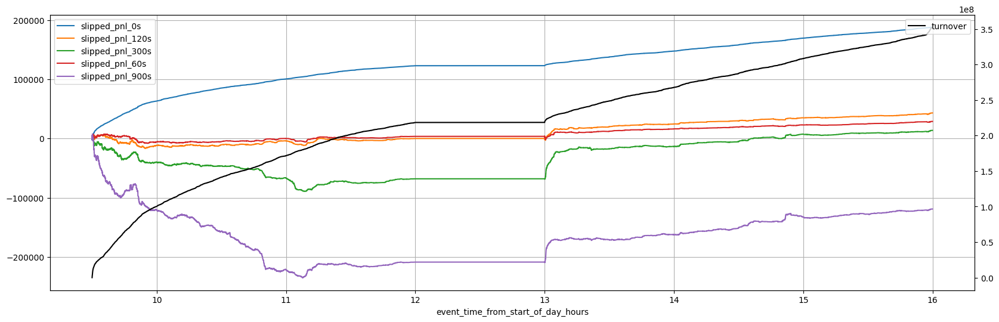

In [64]:
plot(trade_data, index='event_time_from_start_of_day_hours', values=['slipped_pnl_0s', 'slipped_pnl_60s', 'slipped_pnl_120s', 'slipped_pnl_300s', 'slipped_pnl_900s'], values_right='turnover', 
     filters=(lambda x: (x['competitor'] == 'IMC')))

In [65]:
iDisp.display(HTML("<H3>Quote - IMC_BSK PnL by Time of Day</H3>"))

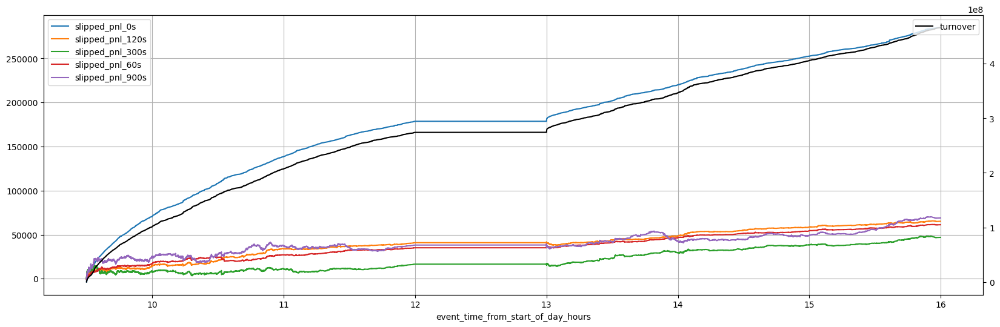

In [66]:
plot(trade_data, index='event_time_from_start_of_day_hours', values=['slipped_pnl_0s', 'slipped_pnl_60s', 'slipped_pnl_120s', 'slipped_pnl_300s', 'slipped_pnl_900s'], values_right='turnover', 
     filters=(lambda x: (x['competitor'] == 'IMC_BSK')))

In [67]:
iDisp.display(HTML("<H3>Quote - Competitors PnL by Time of Day</H3>"))

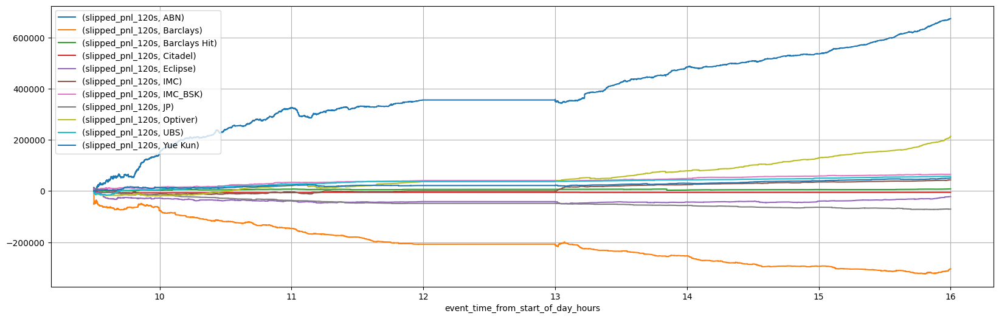

In [68]:
plot(trade_data, index='event_time_from_start_of_day_hours', values=['slipped_pnl_120s'], 
     filters=(lambda x: (~x['competitor'].isin(['MKT', 'UNKNOWN']))), columns='competitor')

In [69]:
iDisp.display(HTML("<H3>Quote - Competitors Turnover by Time of Day</H3>"))

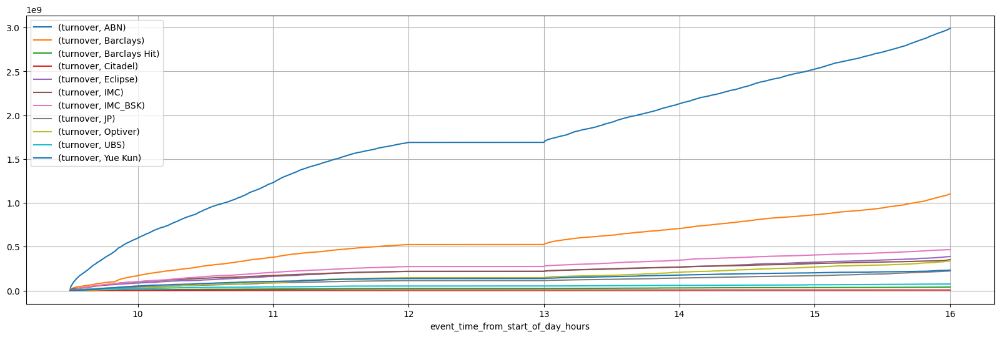

In [70]:
plot(trade_data, index='event_time_from_start_of_day_hours', values=['turnover'], 
     filters=(lambda x: (~x['competitor'].isin(['MKT', 'UNKNOWN']))), columns='competitor')

In [71]:
iDisp.display(HTML("<H3>Hit - Own PnL by Time of Day</H3>"))

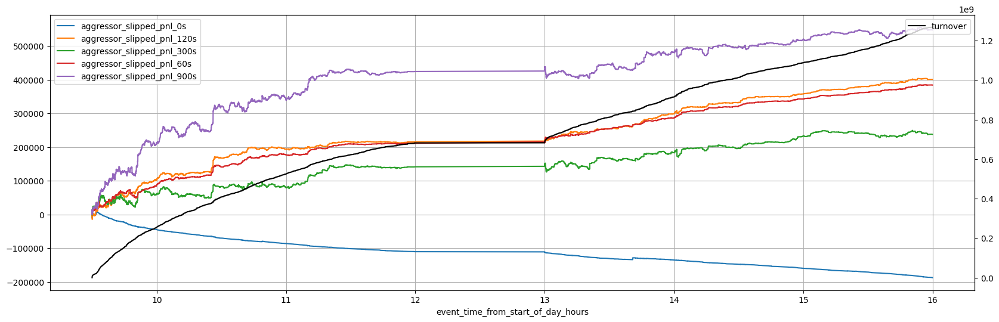

In [72]:
plot(trade_data, index='event_time_from_start_of_day_hours', values=['aggressor_slipped_pnl_0s', 'aggressor_slipped_pnl_60s', 'aggressor_slipped_pnl_120s', 'aggressor_slipped_pnl_300s', 'aggressor_slipped_pnl_900s'], 
     values_right='turnover', filters=(lambda x: (x['aggressive_competitor'] == 'IMC')))

In [73]:
iDisp.display(HTML("<H3>Hit - Competitors PnL by Time of Day</H3>"))

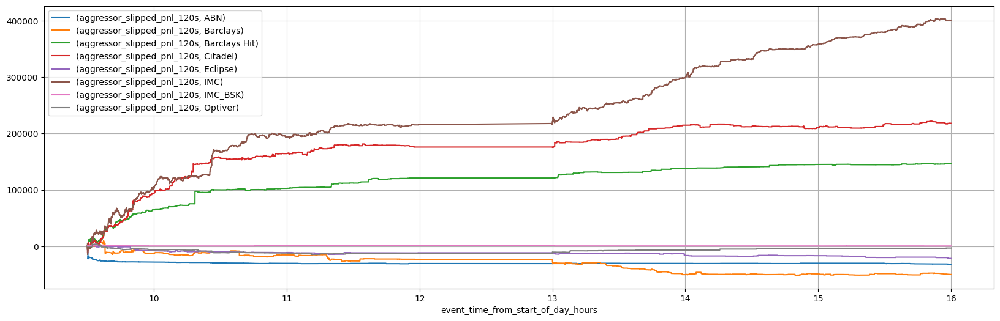

In [74]:
plot(trade_data, index='event_time_from_start_of_day_hours', values=['aggressor_slipped_pnl_120s'], 
     filters=(lambda x: (~x['aggressive_competitor'].isin(['MKT', 'UNKNOWN']))), columns='aggressive_competitor')

In [75]:
iDisp.display(HTML("<H3>Hit - Competitors Turnover by Time of Day</H3>"))

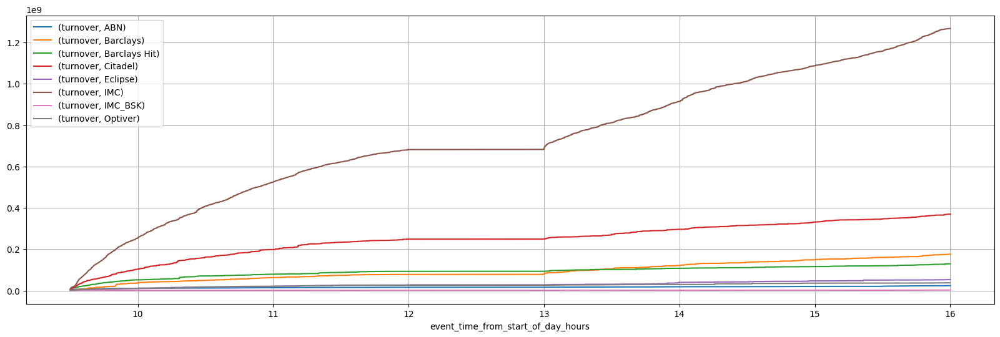

In [76]:
plot(trade_data, index='event_time_from_start_of_day_hours', values=['turnover'], 
     filters=(lambda x: (~x['aggressive_competitor'].isin(['MKT', 'UNKNOWN']))), columns='aggressive_competitor')

In [77]:
from hk_stock_hedging.deployment_data import RF_DEPLOYMENT_MAP, HT_DEPLOYMENT_MAP, THRESHOLD_DEPLOYMENT_MAP, MODIFIER_DEPLOYMENT_MAP, TRADING_DEPLOYMENT_MAP, RF_CTS_VAL_DEPLOYMENT_MAP

RF_VAL_STOCKS = list(RF_DEPLOYMENT_MAP.keys())
# RF_VAL_STOCKS = []

RF_VAL_OPTION_STOCKS = list(HT_DEPLOYMENT_MAP.keys())
# RF_VAL_OPTION_STOCKS = []

RF_CTS_VAL_STOCKS = list(set(RF_VAL_OPTION_STOCKS) - set(RF_VAL_STOCKS)) # ideally this should be list(RF_CTS_VAL_DEPLOYMENT_MAP.keys())

In [78]:
iDisp.display(HTML("<H3>Quote - RF_CTS_VAL_STOCKS min credit over life graphs"))

In [79]:
def plot(data, index, values, title=None,values_right=None, filters=None, xlim=None, interval=None, columns=None):
    def create_pivot(data, index, values, filters):
        return pd.DataFrame(
            (data if not filters else data.loc[filters])
            .pipe(pd.pivot_table, index=index, values=(values if isinstance(values, list) else [values]), columns=columns, aggfunc='sum')
            .cumsum()
            .ffill()
        )
    
    df = create_pivot(data, index, values, filters)
    ax1 = df.plot(figsize=(20,6), grid=True,drawstyle='steps-post',title=title)
    ax1.legend(loc='upper left')
    if xlim:
        ax1.set_xlim(xlim)
        if interval:
            ax1.set_xticks(range(xlim[0], xlim[1]+interval, interval))
    if values_right:
        ax2 = ax1.twinx()
        ax2.spines['right'].set_position(('axes', 1.0))
        create_pivot(data, index, values_right, filters).plot(ax=ax2, c='k',drawstyle='steps-post').legend(loc='upper right')
    plt.show()

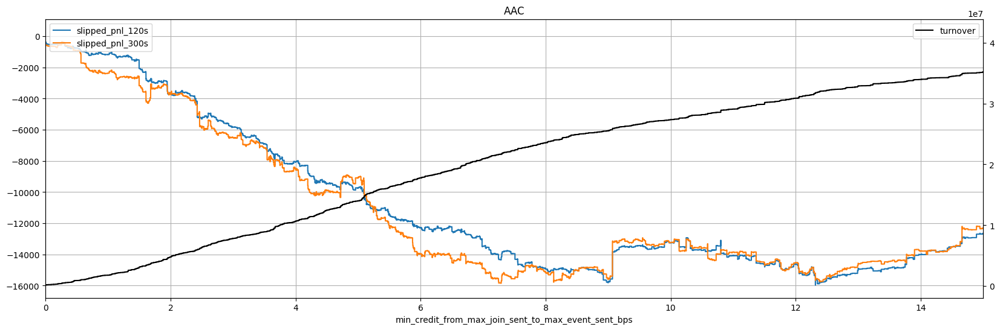

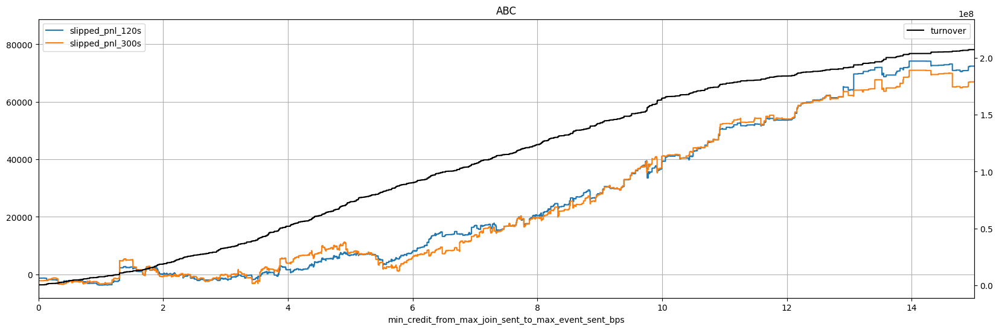

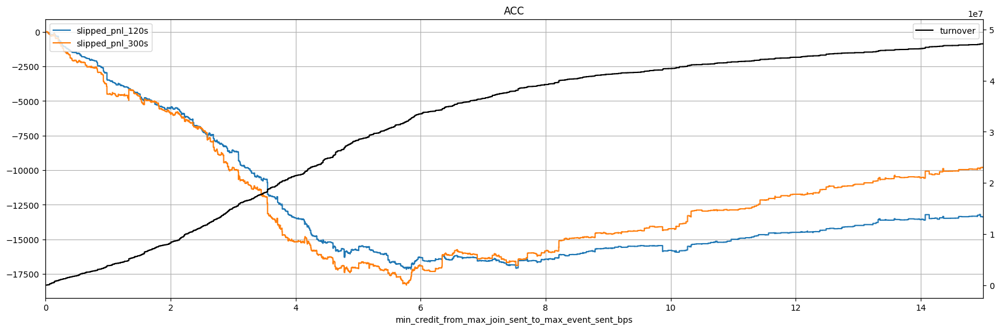

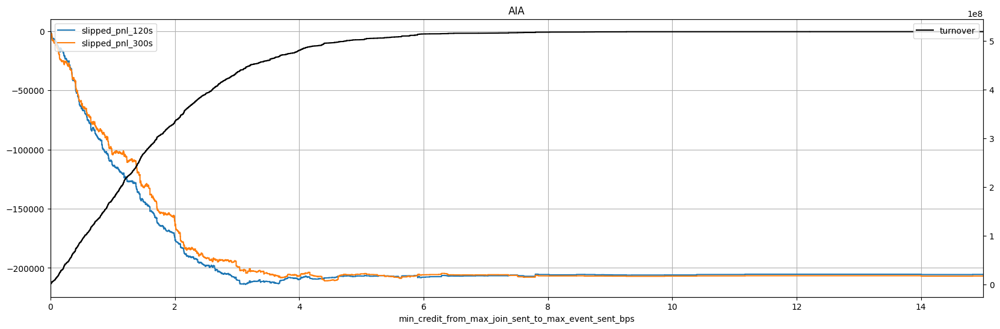

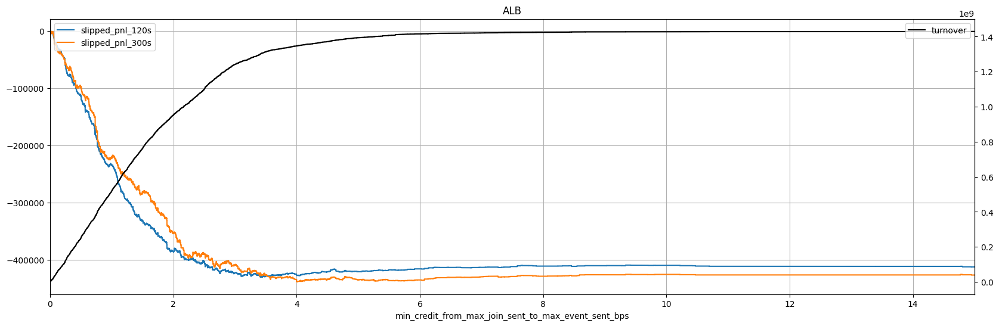

...

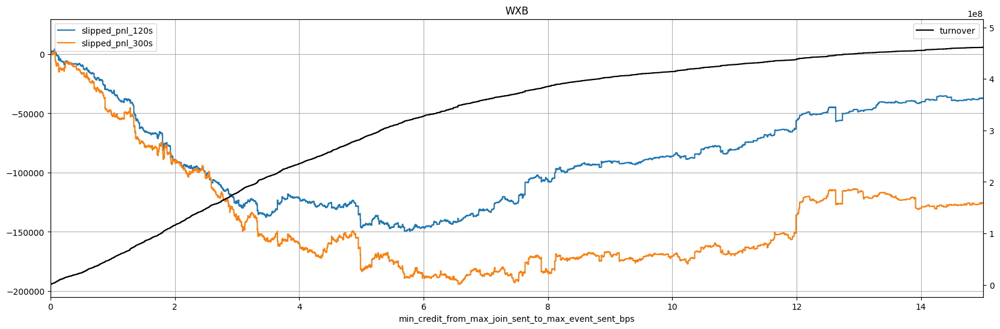

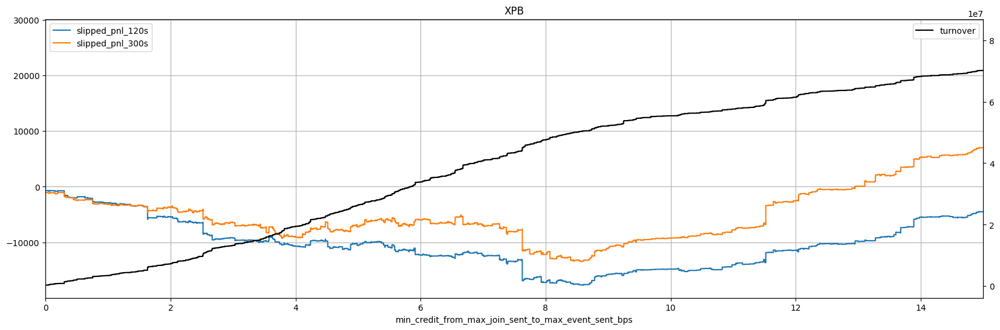

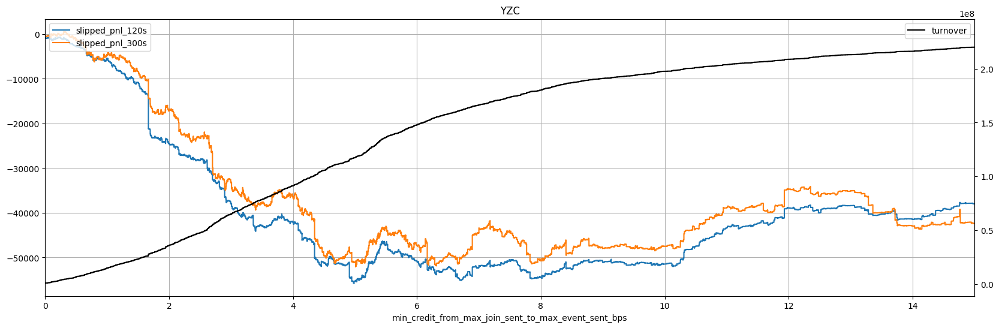

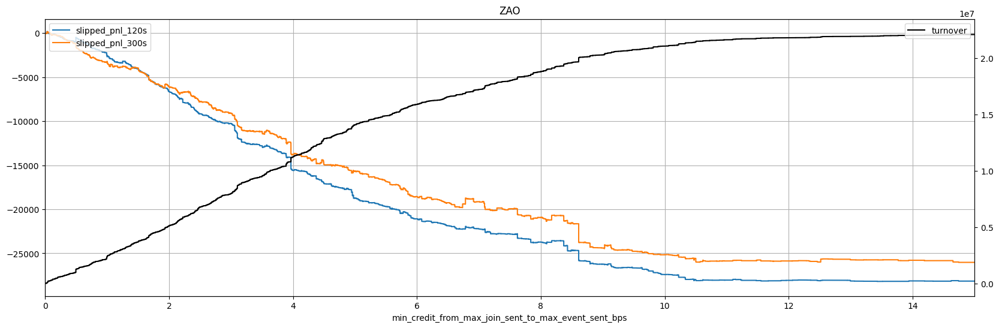

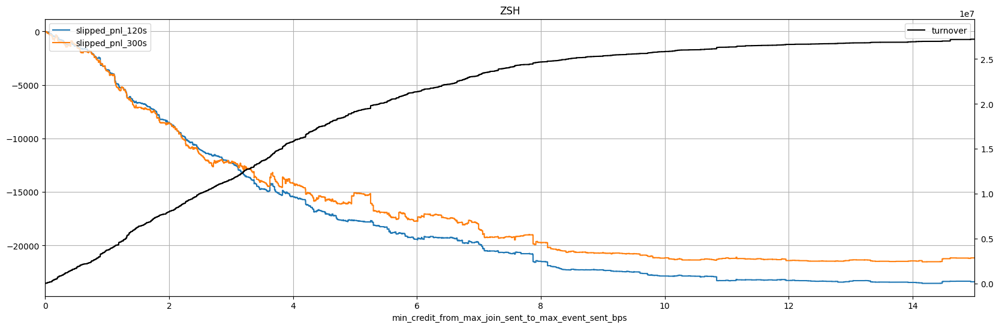

In [80]:
for symbol in sorted(RF_CTS_VAL_STOCKS):
    try:
        plot(trade_data,'min_credit_from_max_join_sent_to_max_event_sent_bps',['slipped_pnl_120s','slipped_pnl_300s'],values_right='turnover',filters=(lambda x: (x.product_symbol==symbol)&(x.min_credit_from_max_join_sent_to_max_event_sent_bps>=0)),title=symbol,xlim=(0,15))
    except:
        continue

## Hit Competitor Pnl Per Symbol (k AUD)

In [81]:
merged_data = trade_data[lambda x : x['aggressive_competitor'].isin(['Citadel','Barclays Hit','IMC'])]
merged_pnl = merged_data.groupby(['date','aggressive_competitor','hkats_code']).sum()[['aggressor_slipped_pnl_300s']].unstack().fillna(0)['aggressor_slipped_pnl_300s']/1e3
sorted_symbols = list(merged_pnl.mean(axis=0).sort_values(ascending=False).index)
display(merged_pnl[sorted_symbols[0:30]].unstack(1).fillna(0)
        .style.format(precision=0) 
        .background_gradient(cmap="RdBu", vmin=-100, vmax=100.0)
        .set_table_styles(
            [
            {"selector": "", "props": [("border", "5px solid grey")]},
            {"selector": "tbody td", "props": [("border", "1px solid grey")]},
            {"selector": "th", "props": [("border", "2px solid grey")]}
            ]
        )
   )

KeyError: 'hkats_code'

## Citadel Sided Hit Turnover (m AUD)

In [ ]:
cit_to = trade_data[lambda x : x['aggressive_competitor'].isin(['Citadel'])].groupby(['date','side','hkats_code']).sum()[['turnover']].unstack().fillna(0)['turnover']/1e6
cit_sorted_symbols = list(cit_to.mean(axis=0).sort_values(ascending=False).index)

display(cit_to[[x for x in sorted_symbols if x in cit_sorted_symbols][0:30]].unstack(1).fillna(0)
        .style.format(precision=0) 
        .background_gradient(cmap="Reds", vmin=0, vmax=10.0)
        .set_table_styles(
            [
            {"selector": "", "props": [("border", "5px solid grey")]},
            {"selector": "tbody td", "props": [("border", "1px solid grey")]},
            {"selector": "th", "props": [("border", "2px solid grey")]}
            ]
        )
   )
      

## Barclays Sided Hit Turnover (m AUD)

In [ ]:
barc_to = trade_data[lambda x : x['aggressive_competitor'].isin(['Barclays Hit'])].groupby(['date','side','hkats_code']).sum()[['turnover']].unstack().fillna(0)['turnover']/1e6
barc_sorted_symbols = list(barc_to.mean(axis=0).sort_values(ascending=False).index)
display(barc_to[[x for x in sorted_symbols if x in barc_sorted_symbols][0:30]].unstack(1).fillna(0)
        .style.format(precision=0) 
        .background_gradient(cmap="Reds", vmin=0, vmax=10.0)
        .set_table_styles(
            [
            {"selector": "", "props": [("border", "5px solid grey")]},
            {"selector": "tbody td", "props": [("border", "1px solid grey")]},
            {"selector": "th", "props": [("border", "2px solid grey")]}
            ]
        )
   )
      

## IMC Sided Hit Turnover (m AUD)

In [ ]:
barc_to = trade_data[lambda x : x['aggressive_competitor'].isin(['IMC'])].groupby(['date','side','hkats_code']).sum()[['turnover']].unstack().fillna(0)['turnover']/1e6
barc_sorted_symbols = list(barc_to.mean(axis=0).sort_values(ascending=False).index)
display(barc_to[[x for x in sorted_symbols if x in barc_sorted_symbols][0:30]].unstack(1).fillna(0)
        .style.format(precision=0) 
        .background_gradient(cmap="Reds", vmin=0, vmax=10.0)
        .set_table_styles(
            [
            {"selector": "", "props": [("border", "5px solid grey")]},
            {"selector": "tbody td", "props": [("border", "1px solid grey")]},
            {"selector": "th", "props": [("border", "2px solid grey")]}
            ]
        )
   )
      